In [ ]:
! unzip "dataset.zip"
! unzip "human_poses_data"

Импортируем библиотеки для визуализации датасет

In [94]:
import pandas as pd
import plotly.express as px

Анализ датасета:

In [95]:
train_path = './human_poses_data/img_train'
test_path = './human_poses_data/img_test'
train_csv_path = './human_poses_data/train_answers.csv'
categories_path = './human_poses_data/activity_categories.csv'

In [96]:
train_df = pd.read_csv(train_csv_path)
train_df

,img_id,target_feature
0,17363,2
1,8612,5
2,8244,0
3,9264,0
4,5382,6
...,...,...
12362,11503,4
12363,12201,6
12364,5489,3
12365,883,5


In [97]:
act_cat_df = pd.read_csv(categories_path)
categories = act_cat_df['category'].astype('category').cat.categories
print(categories)

Index(['bicycling', 'conditioning exercise', 'dancing', 'fishing and hunting',
       'home activities', 'home repair', 'inactivity quiet', 'lawn and garden',
       'miscellaneous', 'music playing', 'occupation', 'religious activities',
       'running', 'self care', 'sports', 'transportation',
       'volunteer activities', 'walking', 'water activities',
       'winter activities'],
      dtype='object')


In [98]:
train_df = train_df.merge(act_cat_df, left_on='target_feature', right_on='id', how='left')
train_df = train_df.drop(columns=['id'])
train_df

,img_id,target_feature,category
0,17363,2,miscellaneous
1,8612,5,home activities
2,8244,0,sports
3,9264,0,sports
4,5382,6,lawn and garden
...,...,...,...
12362,11503,4,water activities
12363,12201,6,lawn and garden
12364,5489,3,occupation
12365,883,5,home activities


In [99]:
fig = px.histogram(train_df, x='category', title='Distribution of Classes in Training Set')
fig.show()

Из 20 классов 4 класса являются пустыми

В датасете большая разбалансировка классов изображений, максимальное количество изображений в классе 2512, а минимальное 135 в классе inactivity quiet

Преобработка данных:

Чтобы при обучении модели по итогу получить нормальные веса, будем балансировать классы по изображениям, для этого сделаем:
1. Отзеркалить все картинки в классах
2. Приблизить на 50% все картинки в классах
3. Повернуть на 10 градусов все картинки в классах и повернуть на 350 градусов все картинки в классах

Отзеркалим все картинки в классах

In [100]:
import os
import pandas as pd
from PIL import Image

img_folder = './human_poses_data/img_train/'
train_answers_path = './human_poses_data/train_answers.csv'
activity_categories_path = './human_poses_data/activity_categories.csv'

train_answers = pd.read_csv(train_answers_path)
activity_categories = pd.read_csv(activity_categories_path)

image_files = os.listdir(img_folder)

max_id = max([int(os.path.splitext(f)[0]) for f in image_files if f.endswith('.jpg')])

new_rows = []
for img_file in image_files:
    img_path = os.path.join(img_folder, img_file)
    print(img_path)

    with Image.open(img_path) as img:
        mirrored_img = img.transpose(Image.FLIP_LEFT_RIGHT)
        
        new_img_id = max_id + 1
        new_img_file = f"{new_img_id}.jpg"

        mirrored_img.save(os.path.join(img_folder, new_img_file))

        target_feature = train_answers.loc[train_answers['img_id'] == int(img_file.split('.')[0]), 'target_feature'].values
        print(target_feature)
        if len(target_feature) > 0:
            new_row = {'img_id': new_img_file.split('.')[0], 'target_feature': target_feature[0]}
            new_rows.append(new_row)
        
        max_id += 1

if new_rows:
    new_df = pd.DataFrame(new_rows)
    train_answers = pd.concat([train_answers, new_df], ignore_index=True)

train_answers.to_csv('./human_poses_data/train_answers_updated.csv', index=False)

./human_poses_data2/img_train/1.jpg
[9]
./human_poses_data2/img_train/10.jpg
[0]
./human_poses_data2/img_train/1000.jpg
[13]
./human_poses_data2/img_train/10001.jpg
[0]
./human_poses_data2/img_train/10002.jpg
[10]
./human_poses_data2/img_train/10005.jpg
[13]
./human_poses_data2/img_train/10006.jpg
[2]
./human_poses_data2/img_train/1001.jpg
[0]
./human_poses_data2/img_train/10011.jpg
[6]
./human_poses_data2/img_train/10012.jpg
[0]
./human_poses_data2/img_train/10013.jpg
[8]
./human_poses_data2/img_train/10014.jpg
[0]
./human_poses_data2/img_train/10018.jpg
[12]
./human_poses_data2/img_train/10019.jpg
[0]
./human_poses_data2/img_train/10020.jpg
[5]
./human_poses_data2/img_train/10023.jpg
[8]
./human_poses_data2/img_train/10024.jpg
[4]
./human_poses_data2/img_train/10026.jpg
[13]
./human_poses_data2/img_train/10027.jpg
[5]
./human_poses_data2/img_train/10028.jpg
[0]
./human_poses_data2/img_train/10029.jpg
[0]
./human_poses_data2/img_train/10031.jpg
[0]
./human_poses_data2/img_train/10033.

Проверим как отзеркалились картинки

In [101]:
train_path = './human_poses_data/img_train'
test_path = './human_poses_data/img_test'
train_csv_path = './human_poses_data/train_answers_updated.csv'
categories_path = './human_poses_data/activity_categories.csv'

In [102]:
train_df = pd.read_csv(train_csv_path)
train_df

,img_id,target_feature
0,17363,2
1,8612,5
2,8244,0
3,9264,0
4,5382,6
...,...,...
24729,30389,3
24730,30390,8
24731,30391,6
24732,30392,10


In [103]:
act_cat_df = pd.read_csv(categories_path)
categories = act_cat_df['category'].astype('category').cat.categories
print(categories)

Index(['bicycling', 'conditioning exercise', 'dancing', 'fishing and hunting',
       'home activities', 'home repair', 'inactivity quiet', 'lawn and garden',
       'miscellaneous', 'music playing', 'occupation', 'religious activities',
       'running', 'self care', 'sports', 'transportation',
       'volunteer activities', 'walking', 'water activities',
       'winter activities'],
      dtype='object')


In [104]:
train_df = train_df.merge(act_cat_df, left_on='target_feature', right_on='id', how='left')
train_df = train_df.drop(columns=['id'])
train_df

,img_id,target_feature,category
0,17363,2,miscellaneous
1,8612,5,home activities
2,8244,0,sports
3,9264,0,sports
4,5382,6,lawn and garden
...,...,...,...
24729,30389,3,occupation
24730,30390,8,winter activities
24731,30391,6,lawn and garden
24732,30392,10,bicycling


In [105]:
fig = px.histogram(train_df, x='category', title='Distribution of Classes in Training Set')
fig.show()

Далее зазумим картинки на 50%

In [125]:
img_folder = './human_poses_data/img_train/'
csv_file = './human_poses_data/train_answers_updated.csv'

train_answers = pd.read_csv(csv_file)

image_files = os.listdir(img_folder)
max_id = max([int(f.split('.')[0]) for f in image_files if f.endswith('.jpg')]) + 1
print(max_id)

new_rows = []

for img_file in image_files:
    img_path = os.path.join(img_folder, img_file)
    print(img_path)
    with Image.open(img_path) as img:
        new_size = (int(img.width * 1.5), int(img.height * 1.5))
        img = img.resize(new_size, Image.LANCZOS)
        
        left = (img.width - img.width / 1.5) / 2
        top = (img.height - img.height / 1.5) / 2
        right = (img.width + img.width / 1.5) / 2
        bottom = (img.height + img.height / 1.5) / 2
        
        img = img.crop((left, top, right, bottom))
        
        new_img_name = f"{max_id}.jpg"
        new_img_path = os.path.join(img_folder, new_img_name)
        img.save(new_img_path)

        target_feature = train_answers.loc[train_answers['img_id'] == int(img_file.split('.')[0]), 'target_feature'].values
        if len(target_feature) > 0:
            new_row = {'img_id': new_img_name.split('.')[0], 'target_feature': target_feature[0]}
            new_rows.append(new_row)

        max_id += 1

if new_rows:
    new_df = pd.DataFrame(new_rows)
    train_answers = pd.concat([train_answers, new_df], ignore_index=True)

train_answers.to_csv('./human_poses_data/train_answers_updated2.csv', index=False)

30394
./human_poses_data2/img_train/1.jpg
./human_poses_data2/img_train/10.jpg
./human_poses_data2/img_train/1000.jpg
./human_poses_data2/img_train/10001.jpg
./human_poses_data2/img_train/10002.jpg
./human_poses_data2/img_train/10005.jpg
./human_poses_data2/img_train/10006.jpg
./human_poses_data2/img_train/1001.jpg
./human_poses_data2/img_train/10011.jpg
./human_poses_data2/img_train/10012.jpg
./human_poses_data2/img_train/10013.jpg
./human_poses_data2/img_train/10014.jpg
./human_poses_data2/img_train/10018.jpg
./human_poses_data2/img_train/10019.jpg
./human_poses_data2/img_train/10020.jpg
./human_poses_data2/img_train/10023.jpg
./human_poses_data2/img_train/10024.jpg
./human_poses_data2/img_train/10026.jpg
./human_poses_data2/img_train/10027.jpg
./human_poses_data2/img_train/10028.jpg
./human_poses_data2/img_train/10029.jpg
./human_poses_data2/img_train/10031.jpg
./human_poses_data2/img_train/10033.jpg
./human_poses_data2/img_train/10035.jpg
./human_poses_data2/img_train/10037.jpg
./h

Проверим как приблизись картинки

In [126]:
train_path = './human_poses_data/img_train'
test_path = './human_poses_data/img_test'
train_csv_path = './human_poses_data/train_answers_updated2.csv'
categories_path = './human_poses_data/activity_categories.csv'

In [127]:
train_df = pd.read_csv(train_csv_path)
train_df

,img_id,target_feature
0,17363,2
1,8612,5
2,8244,0
3,9264,0
4,5382,6
...,...,...
49463,55123,3
49464,55124,8
49465,55125,6
49466,55126,10


In [128]:
act_cat_df = pd.read_csv(categories_path)
categories = act_cat_df['category'].astype('category').cat.categories
print(categories)

Index(['bicycling', 'conditioning exercise', 'dancing', 'fishing and hunting',
       'home activities', 'home repair', 'inactivity quiet', 'lawn and garden',
       'miscellaneous', 'music playing', 'occupation', 'religious activities',
       'running', 'self care', 'sports', 'transportation',
       'volunteer activities', 'walking', 'water activities',
       'winter activities'],
      dtype='object')


In [129]:
train_df = train_df.merge(act_cat_df, left_on='target_feature', right_on='id', how='left')
train_df = train_df.drop(columns=['id'])
train_df

,img_id,target_feature,category
0,17363,2,miscellaneous
1,8612,5,home activities
2,8244,0,sports
3,9264,0,sports
4,5382,6,lawn and garden
...,...,...,...
49463,55123,3,occupation
49464,55124,8,winter activities
49465,55125,6,lawn and garden
49466,55126,10,bicycling


In [130]:
fig = px.histogram(train_df, x='category', title='Distribution of Classes in Training Set')
fig.show()

Далее повернем все картинки в классах на 10 и 350 градусов

In [136]:
img_folder = './human_poses_data/img_train/'
csv_file = './human_poses_data/train_answers_updated2.csv'

train_answers = pd.read_csv(csv_file)

image_files = os.listdir(img_folder)
max_id = max([int(f.split('.')[0]) for f in image_files if f.endswith('.jpg')]) + 1
print(max_id)

new_rows = []

for img_file in image_files:
    img_path = os.path.join(img_folder, img_file)
    print(img_path)
    with Image.open(img_path) as img:
        img1 = img.rotate(10, expand=True)
        img2 = img.rotate(350, expand=True)
        
        new_img_name1 = f"{max_id}.jpg"
        new_img_path1 = os.path.join(img_folder, new_img_name1)
        img1.save(new_img_path1)

        new_img_name2 = f"{max_id + 1}.jpg"
        new_img_path2 = os.path.join(img_folder, new_img_name2)
        img2.save(new_img_path2)

        target_feature = train_answers.loc[train_answers['img_id'] == int(img_file.split('.')[0]), 'target_feature'].values
        if len(target_feature) > 0:
            new_row1 = {'img_id': new_img_name1.split('.')[0], 'target_feature': target_feature[0]}
            new_row2 = {'img_id': new_img_name2.split('.')[0], 'target_feature': target_feature[0]}
            new_rows.append(new_row1)
            new_rows.append(new_row2)
        
        max_id += 2

if new_rows:
    new_df = pd.DataFrame(new_rows)
    train_answers = pd.concat([train_answers, new_df], ignore_index=True)

train_answers.to_csv('./human_poses_data/train_answers_updated3.csv', index=False)

55128
./human_poses_data2/img_train/1.jpg
./human_poses_data2/img_train/10.jpg
./human_poses_data2/img_train/1000.jpg
./human_poses_data2/img_train/10001.jpg
./human_poses_data2/img_train/10002.jpg
./human_poses_data2/img_train/10005.jpg
./human_poses_data2/img_train/10006.jpg
./human_poses_data2/img_train/1001.jpg
./human_poses_data2/img_train/10011.jpg
./human_poses_data2/img_train/10012.jpg
./human_poses_data2/img_train/10013.jpg
./human_poses_data2/img_train/10014.jpg
./human_poses_data2/img_train/10018.jpg
./human_poses_data2/img_train/10019.jpg
./human_poses_data2/img_train/10020.jpg
./human_poses_data2/img_train/10023.jpg
./human_poses_data2/img_train/10024.jpg
./human_poses_data2/img_train/10026.jpg
./human_poses_data2/img_train/10027.jpg
./human_poses_data2/img_train/10028.jpg
./human_poses_data2/img_train/10029.jpg
./human_poses_data2/img_train/10031.jpg
./human_poses_data2/img_train/10033.jpg
./human_poses_data2/img_train/10035.jpg
./human_poses_data2/img_train/10037.jpg
./h

Проверим как повернулись картинки

In [137]:
train_path = './human_poses_data/img_train'
test_path = './human_poses_data/img_test'
train_csv_path = './human_poses_data/train_answers_updated3.csv'
categories_path = './human_poses_data/activity_categories.csv'

In [138]:
train_df = pd.read_csv(train_csv_path)
train_df

,img_id,target_feature
0,17363,2
1,8612,5
2,8244,0
3,9264,0
4,5382,6
...,...,...
148399,154059,6
148400,154060,10
148401,154061,10
148402,154062,12


In [139]:
act_cat_df = pd.read_csv(categories_path)
categories = act_cat_df['category'].astype('category').cat.categories
print(categories)

Index(['bicycling', 'conditioning exercise', 'dancing', 'fishing and hunting',
       'home activities', 'home repair', 'inactivity quiet', 'lawn and garden',
       'miscellaneous', 'music playing', 'occupation', 'religious activities',
       'running', 'self care', 'sports', 'transportation',
       'volunteer activities', 'walking', 'water activities',
       'winter activities'],
      dtype='object')


In [140]:
train_df = train_df.merge(act_cat_df, left_on='target_feature', right_on='id', how='left')
train_df = train_df.drop(columns=['id'])
train_df

,img_id,target_feature,category
0,17363,2,miscellaneous
1,8612,5,home activities
2,8244,0,sports
3,9264,0,sports
4,5382,6,lawn and garden
...,...,...,...
148399,154059,6,lawn and garden
148400,154060,10,bicycling
148401,154061,10,bicycling
148402,154062,12,dancing


In [141]:
fig = px.histogram(train_df, x='category', title='Distribution of Classes in Training Set')
fig.show()

Нам удалось увеличить датасет с 12367 изображений до 148404

Далее сбалансируем все картинки в классах по минимальному количеству изображений в классе (undersampling), минимальное количество равно 1620

In [142]:
min_class_size = 1620

undersampled_df = pd.DataFrame()
for category in categories:
    category_df = train_df[train_df['category'] == category]
    if len(category_df) > min_class_size:
        undersampled_category_df = category_df.sample(min_class_size, replace=False)
        undersampled_df = pd.concat([undersampled_df, undersampled_category_df])
    else:
        undersampled_df = pd.concat([undersampled_df, category_df])


In [143]:
fig = px.histogram(undersampled_df, x='category', title='Distribution of Classes in Training Set')
fig.show()

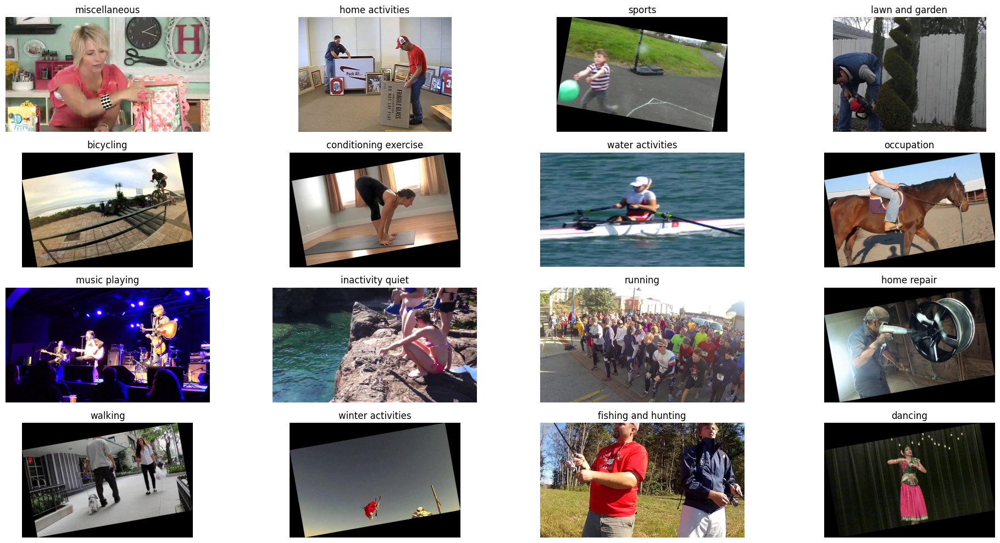

In [146]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 4, figsize=(20, 10))
axes = axes.flatten()
for idx, class_name in enumerate(train_df['category'].unique()):
    class_images = undersampled_df[undersampled_df['category'] == class_name]['img_id'].values
    img = plt.imread(f'{train_path}/{class_images[0]}.jpg')
    axes[idx].imshow(img)
    axes[idx].set_title(class_name)
    axes[idx].axis('off')
plt.tight_layout()
plt.show()

Для обучения модели необходимо переструктирировать датасет, разбить его на train и val, а также внутри этих папок разбить картинки на папки с названием классов, в train все папки с картинками будут иметь 1620 изображений, а в val по 100 изображений

In [148]:
import os
import pandas as pd
import shutil

img_folder = './human_poses_data/img_train/'
train_answers_file = './human_poses_data/train_answers_updated3.csv'
activity_categories_file = './human_poses_data/activity_categories.csv'
output_folder = './dataset'

os.makedirs(os.path.join(output_folder, 'train'), exist_ok=True)
os.makedirs(os.path.join(output_folder, 'val'), exist_ok=True)

train_answers = pd.read_csv(train_answers_file)
activity_categories = pd.read_csv(activity_categories_file)

class_images = {row['id']: [] for _, row in activity_categories.iterrows()}

for _, row in train_answers.iterrows():
    img_id = row['img_id']
    target_feature = row['target_feature']
    img_path = os.path.join(img_folder, f"{img_id}.jpg")
    if os.path.exists(img_path):
        class_images[target_feature].append(img_path)

for class_id, img_paths in class_images.items():
    class_name = activity_categories.loc[activity_categories['id'] == class_id, 'category'].values[0]
    
    train_class_folder = os.path.join(output_folder, 'train', class_name)
    val_class_folder = os.path.join(output_folder, 'val', class_name)
    
    os.makedirs(train_class_folder, exist_ok=True)
    os.makedirs(val_class_folder, exist_ok=True)
    
    for img_path in img_paths[:1620]:
        shutil.copy(img_path, train_class_folder)
    
    for img_path in img_paths[1620:1720]:
        shutil.copy(img_path, val_class_folder)

Датасет для обучения модели YOLO 11 построен, предобработка данных завершена

Структура модели YOLO11

In [ ]:
# BLOCKS 
import torch
import torch.nn as nn
import torch.nn.functional as F

from ultralytics.utils.torch_utils import fuse_conv_and_bn


__all__ = (
    "DFL",
    "HGBlock",
    "HGStem",
    "SPP",
    "SPPF",
    "C1",
    "C2",
    "C3",
    "C2f",
    "C2fAttn",
    "ImagePoolingAttn",
    "ContrastiveHead",
    "BNContrastiveHead",
    "C3x",
    "C3TR",
    "C3Ghost",
    "GhostBottleneck",
    "Bottleneck",
    "BottleneckCSP",
    "Proto",
    "RepC3",
    "ResNetLayer",
    "RepNCSPELAN4",
    "ELAN1",
    "ADown",
    "AConv",
    "SPPELAN",
    "CBFuse",
    "CBLinear",
    "C3k2",
    "C2fPSA",
    "C2PSA",
    "RepVGGDW",
    "CIB",
    "C2fCIB",
    "Attention",
    "PSA",
    "SCDown",
)

class C3(nn.Module):
    def __init__(self, c1, c2, n=1, shortcut=True, g=1, e=0.5):
        super().__init__()
        c_ = int(c2 * e)
        self.cv1 = Conv(c1, c_, 1, 1)
        self.cv2 = Conv(c1, c_, 1, 1)
        self.cv3 = Conv(2 * c_, c2, 1)
        self.m = nn.Sequential(*(Bottleneck(c_, c_, shortcut, g, k=((1, 1), (3, 3)), e=1.0) for _ in range(n)))

    def forward(self, x):
        return self.cv3(torch.cat((self.m(self.cv1(x)), self.cv2(x)), 1))


class C3k(C3):

    def __init__(self, c1, c2, n=1, shortcut=True, g=1, e=0.5, k=3):
        super().__init__(c1, c2, n, shortcut, g, e)
        c_ = int(c2 * e)
        self.m = nn.Sequential(*(Bottleneck(c_, c_, shortcut, g, k=(k, k), e=1.0) for _ in range(n)))


class Bottleneck(nn.Module):
    def __init__(self, c1, c2, shortcut=True, g=1, k=(3, 3), e=0.5):
        super().__init__()
        c_ = int(c2 * e)  # hidden channels
        self.cv1 = Conv(c1, c_, k[0], 1)
        self.cv2 = Conv(c_, c2, k[1], 1, g=g)
        self.add = shortcut and c1 == c2

    def forward(self, x):
        return x + self.cv2(self.cv1(x)) if self.add else self.cv2(self.cv1(x))


class C2f(nn.Module):
    def __init__(self, c1, c2, n=1, shortcut=False, g=1, e=0.5):
        super().__init__()
        self.c = int(c2 * e)
        self.cv1 = Conv(c1, 2 * self.c, 1, 1)
        self.cv2 = Conv((2 + n) * self.c, c2, 1)
        self.m = nn.ModuleList(Bottleneck(self.c, self.c, shortcut, g, k=((3, 3), (3, 3)), e=1.0) for _ in range(n))

    def forward(self, x):
        y = list(self.cv1(x).chunk(2, 1))
        y.extend(m(y[-1]) for m in self.m)
        return self.cv2(torch.cat(y, 1))

    def forward_split(self, x):
        y = self.cv1(x).split((self.c, self.c), 1)
        y = [y[0], y[1]]
        y.extend(m(y[-1]) for m in self.m)
        return self.cv2(torch.cat(y, 1))


class C3k2(C2f):
    def __init__(self, c1, c2, n=1, c3k=False, e=0.5, g=1, shortcut=True):
        super().__init__(c1, c2, n, shortcut, g, e)
        self.m = nn.ModuleList(
            C3k(self.c, self.c, 2, shortcut, g) if c3k else Bottleneck(self.c, self.c, shortcut, g) for _ in range(n)
        )


class Attention(nn.Module):
    def __init__(self, dim, num_heads=8, attn_ratio=0.5):
        super().__init__()
        self.num_heads = num_heads
        self.head_dim = dim // num_heads
        self.key_dim = int(self.head_dim * attn_ratio)
        self.scale = self.key_dim**-0.5
        nh_kd = self.key_dim * num_heads
        h = dim + nh_kd * 2
        self.qkv = Conv(dim, h, 1, act=False)
        self.proj = Conv(dim, dim, 1, act=False)
        self.pe = Conv(dim, dim, 3, 1, g=dim, act=False)

    def forward(self, x):
        B, C, H, W = x.shape
        N = H * W
        qkv = self.qkv(x)
        q, k, v = qkv.view(B, self.num_heads, self.key_dim * 2 + self.head_dim, N).split(
            [self.key_dim, self.key_dim, self.head_dim], dim=2
        )

        attn = (q.transpose(-2, -1) @ k) * self.scale
        attn = attn.softmax(dim=-1)
        x = (v @ attn.transpose(-2, -1)).view(B, C, H, W) + self.pe(v.reshape(B, C, H, W))
        x = self.proj(x)
        return x


class PSABlock(nn.Module):
    def __init__(self, c, attn_ratio=0.5, num_heads=4, shortcut=True) -> None:
        super().__init__()

        self.attn = Attention(c, attn_ratio=attn_ratio, num_heads=num_heads)
        self.ffn = nn.Sequential(Conv(c, c * 2, 1), Conv(c * 2, c, 1, act=False))
        self.add = shortcut

    def forward(self, x):
        x = x + self.attn(x) if self.add else self.attn(x)
        x = x + self.ffn(x) if self.add else self.ffn(x)
        return x


class C2PSA(nn.Module):
    def __init__(self, c1, c2, n=1, e=0.5):
        super().__init__()
        assert c1 == c2
        self.c = int(c1 * e)
        self.cv1 = Conv(c1, 2 * self.c, 1, 1)
        self.cv2 = Conv(2 * self.c, c1, 1)

        self.m = nn.Sequential(*(PSABlock(self.c, attn_ratio=0.5, num_heads=self.c // 64) for _ in range(n)))

    def forward(self, x):
        a, b = self.cv1(x).split((self.c, self.c), dim=1)
        b = self.m(b)
        return self.cv2(torch.cat((a, b), 1))

In [ ]:
import math

import numpy as np
import torch
import torch.nn as nn

__all__ = (
    "Conv",
    "Conv2",
    "LightConv",
    "DWConv",
    "DWConvTranspose2d",
    "ConvTranspose",
    "Focus",
    "GhostConv",
    "ChannelAttention",
    "SpatialAttention",
    "CBAM",
    "Concat",
    "RepConv",
)


def autopad(k, p=None, d=1):
    """Pad to 'same' shape outputs."""
    if d > 1:
        k = d * (k - 1) + 1 if isinstance(k, int) else [d * (x - 1) + 1 for x in k]  # actual kernel-size
    if p is None:
        p = k // 2 if isinstance(k, int) else [x // 2 for x in k]  # auto-pad
    return p

class Conv(nn.Module):
    """Standard convolution with args(ch_in, ch_out, kernel, stride, padding, groups, dilation, activation)."""

    default_act = nn.SiLU()

    def __init__(self, c1, c2, k=1, s=1, p=None, g=1, d=1, act=True):
        super().__init__()
        self.conv = nn.Conv2d(c1, c2, k, s, autopad(k, p, d), groups=g, dilation=d, bias=False)
        self.bn = nn.BatchNorm2d(c2)
        self.act = self.default_act if act is True else act if isinstance(act, nn.Module) else nn.Identity()

    def forward(self, x):
        return self.act(self.bn(self.conv(x)))

    def forward_fuse(self, x):
        return self.act(self.conv(x))

In [ ]:
import copy
import math

import torch
import torch.nn as nn
from torch.nn.init import constant_, xavier_uniform_

from ultralytics.utils.tal import TORCH_1_10, dist2bbox, dist2rbox, make_anchors

__all__ = "Detect", "Segment", "Pose", "Classify", "OBB", "RTDETRDecoder", "v10Detect"

class Classify(nn.Module):
    export = False

    def __init__(self, c1, c2, k=1, s=1, p=None, g=1):
        super().__init__()
        c_ = 1280
        self.conv = Conv(c1, c_, k, s, p, g)
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.drop = nn.Dropout(p=0.0, inplace=True)
        self.linear = nn.Linear(c_, c2)

    def forward(self, x):
        if isinstance(x, list):
            x = torch.cat(x, 1)
        x = self.linear(self.drop(self.pool(self.conv(x)).flatten(1)))
        if self.training:
            return x
        y = x.softmax(1)
        return y

In [ ]:
class MyYOLO(nn.Module):
    def __init__(self, num_classes=16):
        super(MyYOLO, self).__init__()
        
        self.model = nn.Sequential(
            Conv(3, 64, 3, 2),
            C3k2(64, 128, 1, False, 0.25),
            Conv(128, 256, 3, 2),
            C3k2(256, 256, 1, False, 0.25),
            Conv(512, 512, 3, 2),
            C3k2(512, 512, 1, True),
            Conv(512, 1024, 3, 2),
            C3k2(1024, 1024, 1, True),
            C2PSA(1024, 1024, 1),
            Classify(1024, num_classes)
        )

    def forward(self, x):
        return self.model(x)

In [2]:
import torch

torch.cuda.empty_cache()

mydevice = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
mydevice

device(type='cuda', index=0)

Обучим свою кастомную модель на основе модели YOLO, архитектура модели лежит по пути ./custom_model.yaml

Входной размер изображения установим 512, batch_size=4 так как, если взять больше, нам нехватит ресурсов видеокарты и оперативной памяти

Обучим модель

In [ ]:
from ultralytics import YOLO

model = YOLO('./custom_model.yaml')

results = model.train(data='./dataset2', epochs=400, imgsz=512, batch=4, pretrained=False, device=mydevice)

WARNING  no model scale passed. Assuming scale='n'.
custom_model summary: 151 layers, 1,560,056 parameters, 1,560,056 gradients, 3.4 GFLOPs
engine\trainer: task=classify, mode=train, model=./custom_model.yaml, data=./dataset2, epochs=400, time=None, patience=100, batch=4, imgsz=512, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train20, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sav

train: Scanning D:\Учеба\ЯндексЛицей\YOLO6\dataset2\train... 25920 images, 0 corrupt: 100%|██████████| 25920/25920 [00:00<?, ?it/s]
val: Scanning D:\Учеба\ЯндексЛицей\YOLO6\dataset2\val... 1576 images, 0 corrupt: 100%|██████████| 1576/1576 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to runs\classify\train20
Starting training for 400 epochs...

      Epoch    GPU_mem       loss  Instances       Size


      1/400     0.312G      2.716          4        512: 100%|██████████| 6480/6480 [05:29<00:00, 19.67it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.43it/s]

                   all      0.173      0.552



      Epoch    GPU_mem       loss  Instances       Size


      2/400     0.312G      2.607          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.50it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.52it/s]

                   all      0.199      0.605



      Epoch    GPU_mem       loss  Instances       Size


      3/400     0.312G      2.545          4        512: 100%|██████████| 6480/6480 [05:35<00:00, 19.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.226      0.574



      Epoch    GPU_mem       loss  Instances       Size


      4/400     0.312G       2.51          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.233      0.671



      Epoch    GPU_mem       loss  Instances       Size


      5/400     0.312G      2.439          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.36it/s]

                   all      0.253      0.685



      Epoch    GPU_mem       loss  Instances       Size


      6/400     0.312G       2.41          4        512: 100%|██████████| 6480/6480 [05:24<00:00, 19.95it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.52it/s]

                   all      0.272      0.746



      Epoch    GPU_mem       loss  Instances       Size


      7/400     0.312G      2.359          4        512: 100%|██████████| 6480/6480 [05:26<00:00, 19.86it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.63it/s]

                   all      0.279       0.76



      Epoch    GPU_mem       loss  Instances       Size


      8/400     0.312G      2.308          4        512: 100%|██████████| 6480/6480 [05:10<00:00, 20.89it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.86it/s]

                   all      0.287      0.771



      Epoch    GPU_mem       loss  Instances       Size


      9/400     0.312G      2.276          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.09it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.90it/s]

                   all        0.3      0.766



      Epoch    GPU_mem       loss  Instances       Size


     10/400     0.312G      2.256          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 21.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.318      0.784



      Epoch    GPU_mem       loss  Instances       Size


     11/400     0.312G      2.218          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 21.02it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.98it/s]

                   all      0.326      0.784



      Epoch    GPU_mem       loss  Instances       Size


     12/400     0.312G      2.193          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.05it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.99it/s]

                   all      0.322      0.765



      Epoch    GPU_mem       loss  Instances       Size


     13/400     0.312G      2.162          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.92it/s]

                   all      0.334      0.796



      Epoch    GPU_mem       loss  Instances       Size


     14/400     0.312G      2.138          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.80it/s]

                   all      0.345      0.794



      Epoch    GPU_mem       loss  Instances       Size


     15/400     0.312G      2.114          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all       0.35      0.804



      Epoch    GPU_mem       loss  Instances       Size


     16/400     0.312G      2.095          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.362      0.805



      Epoch    GPU_mem       loss  Instances       Size


     17/400     0.312G      2.074          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 21.01it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all      0.368      0.786



      Epoch    GPU_mem       loss  Instances       Size


     18/400     0.312G      2.058          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all      0.374      0.808



      Epoch    GPU_mem       loss  Instances       Size


     19/400     0.312G      2.034          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.08it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.67it/s]

                   all      0.391      0.805



      Epoch    GPU_mem       loss  Instances       Size


     20/400     0.312G      2.006          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 21.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.94it/s]

                   all      0.391      0.803



      Epoch    GPU_mem       loss  Instances       Size


     21/400     0.312G      1.989          4        512: 100%|██████████| 6480/6480 [05:11<00:00, 20.80it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:16<00:00, 12.19it/s]

                   all      0.398      0.815



      Epoch    GPU_mem       loss  Instances       Size


     22/400     0.312G      1.967          4        512: 100%|██████████| 6480/6480 [05:34<00:00, 19.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.03it/s]

                   all      0.401      0.824



      Epoch    GPU_mem       loss  Instances       Size


     23/400     0.312G      1.935          4        512: 100%|██████████| 6480/6480 [05:24<00:00, 19.97it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.86it/s]

                   all      0.404      0.826



      Epoch    GPU_mem       loss  Instances       Size


     24/400     0.312G      1.936          4        512: 100%|██████████| 6480/6480 [05:24<00:00, 19.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.21it/s]

                   all      0.415      0.829



      Epoch    GPU_mem       loss  Instances       Size


     25/400     0.312G      1.913          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all      0.427      0.837



      Epoch    GPU_mem       loss  Instances       Size


     26/400     0.312G      1.892          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.30it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all       0.43      0.842



      Epoch    GPU_mem       loss  Instances       Size


     27/400     0.312G      1.867          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.73it/s]

                   all      0.433      0.849



      Epoch    GPU_mem       loss  Instances       Size


     28/400     0.312G      1.856          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.92it/s]

                   all      0.438      0.853



      Epoch    GPU_mem       loss  Instances       Size


     29/400     0.312G      1.832          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all       0.44       0.85



      Epoch    GPU_mem       loss  Instances       Size


     30/400     0.312G      1.803          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.88it/s]


                   all      0.443      0.848

      Epoch    GPU_mem       loss  Instances       Size


     31/400     0.312G      1.785          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.72it/s]

                   all       0.45      0.853



      Epoch    GPU_mem       loss  Instances       Size


     32/400     0.312G      1.763          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.82it/s]

                   all      0.454      0.853



      Epoch    GPU_mem       loss  Instances       Size


     33/400     0.312G      1.746          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.89it/s]

                   all      0.457      0.856



      Epoch    GPU_mem       loss  Instances       Size


     34/400     0.312G      1.731          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.77it/s]

                   all      0.456       0.86



      Epoch    GPU_mem       loss  Instances       Size


     35/400     0.312G      1.718          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.89it/s]

                   all      0.461      0.864



      Epoch    GPU_mem       loss  Instances       Size


     36/400     0.312G       1.69          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.72it/s]

                   all      0.461      0.863



      Epoch    GPU_mem       loss  Instances       Size


     37/400     0.312G      1.668          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.88it/s]

                   all      0.462      0.864



      Epoch    GPU_mem       loss  Instances       Size


     38/400     0.312G      1.659          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.465      0.866



      Epoch    GPU_mem       loss  Instances       Size


     39/400     0.312G      1.636          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all      0.471      0.867



      Epoch    GPU_mem       loss  Instances       Size


     40/400     0.312G       1.61          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.64it/s]

                   all      0.473      0.869



      Epoch    GPU_mem       loss  Instances       Size


     41/400     0.312G      1.592          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.475      0.871



      Epoch    GPU_mem       loss  Instances       Size


     42/400     0.312G      1.582          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.473      0.873



      Epoch    GPU_mem       loss  Instances       Size


     43/400     0.312G       1.55          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all      0.477      0.874



      Epoch    GPU_mem       loss  Instances       Size


     44/400     0.312G      1.526          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.479      0.874



      Epoch    GPU_mem       loss  Instances       Size


     45/400     0.312G       1.52          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.69it/s]

                   all      0.479      0.876



      Epoch    GPU_mem       loss  Instances       Size


     46/400     0.312G      1.499          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.67it/s]

                   all       0.48      0.877



      Epoch    GPU_mem       loss  Instances       Size


     47/400     0.312G      1.487          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.53it/s]

                   all      0.482      0.881



      Epoch    GPU_mem       loss  Instances       Size


     48/400     0.312G      1.466          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.86it/s]

                   all      0.485       0.88



      Epoch    GPU_mem       loss  Instances       Size


     49/400     0.312G       1.45          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.60it/s]

                   all      0.488      0.882



      Epoch    GPU_mem       loss  Instances       Size


     50/400     0.312G      1.429          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.64it/s]

                   all      0.489      0.885



      Epoch    GPU_mem       loss  Instances       Size


     51/400     0.312G      1.414          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.77it/s]

                   all      0.493      0.886



      Epoch    GPU_mem       loss  Instances       Size


     52/400     0.312G      1.381          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.491      0.885



      Epoch    GPU_mem       loss  Instances       Size


     53/400     0.312G      1.374          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.53it/s]

                   all      0.491      0.884



      Epoch    GPU_mem       loss  Instances       Size


     54/400     0.312G      1.363          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.63it/s]

                   all      0.496      0.885



      Epoch    GPU_mem       loss  Instances       Size


     55/400     0.312G      1.337          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.499      0.884



      Epoch    GPU_mem       loss  Instances       Size


     56/400     0.312G      1.322          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.42it/s]

                   all      0.502      0.885



      Epoch    GPU_mem       loss  Instances       Size


     57/400     0.312G      1.307          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.67it/s]

                   all      0.505      0.885



      Epoch    GPU_mem       loss  Instances       Size


     58/400     0.312G      1.289          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.505      0.887



      Epoch    GPU_mem       loss  Instances       Size


     59/400     0.312G      1.278          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.74it/s]

                   all      0.504      0.887



      Epoch    GPU_mem       loss  Instances       Size


     60/400     0.312G      1.259          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.12it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.57it/s]

                   all      0.509      0.888



      Epoch    GPU_mem       loss  Instances       Size


     61/400     0.312G      1.248          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.11it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all       0.51      0.888



      Epoch    GPU_mem       loss  Instances       Size


     62/400     0.312G      1.233          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.77it/s]

                   all       0.51      0.888



      Epoch    GPU_mem       loss  Instances       Size


     63/400     0.312G      1.211          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all      0.512      0.889



      Epoch    GPU_mem       loss  Instances       Size


     64/400     0.312G      1.219          4        512: 100%|██████████| 6480/6480 [05:07<00:00, 21.10it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.77it/s]

                   all      0.512      0.889



      Epoch    GPU_mem       loss  Instances       Size


     65/400     0.312G      1.189          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.65it/s]

                   all      0.513      0.891



      Epoch    GPU_mem       loss  Instances       Size


     66/400     0.312G      1.196          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.516      0.892



      Epoch    GPU_mem       loss  Instances       Size


     67/400     0.312G      1.162          4        512: 100%|██████████| 6480/6480 [05:25<00:00, 19.92it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.33it/s]


                   all       0.52      0.893

      Epoch    GPU_mem       loss  Instances       Size


     68/400     0.312G      1.145          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.36it/s]

                   all      0.522      0.895



      Epoch    GPU_mem       loss  Instances       Size


     69/400     0.312G      1.131          4        512: 100%|██████████| 6480/6480 [05:15<00:00, 20.51it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.35it/s]

                   all      0.524      0.895



      Epoch    GPU_mem       loss  Instances       Size


     70/400     0.312G      1.123          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.49it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.33it/s]

                   all      0.527      0.895



      Epoch    GPU_mem       loss  Instances       Size


     71/400     0.312G      1.112          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.24it/s]

                   all      0.531      0.896



      Epoch    GPU_mem       loss  Instances       Size


     72/400     0.312G      1.099          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.50it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.18it/s]

                   all      0.536      0.896



      Epoch    GPU_mem       loss  Instances       Size


     73/400     0.312G      1.082          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.46it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.11it/s]

                   all      0.539      0.898



      Epoch    GPU_mem       loss  Instances       Size


     74/400     0.312G      1.074          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.49it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.16it/s]

                   all      0.538      0.895



      Epoch    GPU_mem       loss  Instances       Size


     75/400     0.312G      1.059          4        512: 100%|██████████| 6480/6480 [05:16<00:00, 20.48it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.43it/s]

                   all      0.538      0.897



      Epoch    GPU_mem       loss  Instances       Size


     76/400     0.312G       1.06          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.23it/s]

                   all      0.544      0.898



      Epoch    GPU_mem       loss  Instances       Size


     77/400     0.312G      1.033          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.16it/s]

                   all      0.548      0.899



      Epoch    GPU_mem       loss  Instances       Size


     78/400     0.312G      1.033          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.25it/s]

                   all      0.553        0.9



      Epoch    GPU_mem       loss  Instances       Size


     79/400     0.312G       1.02          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.23it/s]

                   all      0.555      0.902



      Epoch    GPU_mem       loss  Instances       Size


     80/400     0.312G      1.007          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.20it/s]

                   all      0.558      0.905



      Epoch    GPU_mem       loss  Instances       Size


     81/400     0.312G     0.9988          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.30it/s]

                   all      0.564      0.909



      Epoch    GPU_mem       loss  Instances       Size


     82/400     0.312G     0.9806          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.28it/s]

                   all      0.567      0.909



      Epoch    GPU_mem       loss  Instances       Size


     83/400     0.312G     0.9695          4        512: 100%|██████████| 6480/6480 [05:26<00:00, 19.83it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.59it/s]

                   all      0.571      0.911



      Epoch    GPU_mem       loss  Instances       Size


     84/400     0.312G     0.9575          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.91it/s]

                   all      0.579      0.912



      Epoch    GPU_mem       loss  Instances       Size


     85/400     0.312G     0.9565          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.10it/s]

                   all      0.584      0.912



      Epoch    GPU_mem       loss  Instances       Size


     86/400     0.312G      0.943          4        512: 100%|██████████| 6480/6480 [05:17<00:00, 20.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.08it/s]

                   all      0.588      0.911



      Epoch    GPU_mem       loss  Instances       Size


     87/400     0.312G     0.9323          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.30it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.11it/s]

                   all      0.592      0.912



      Epoch    GPU_mem       loss  Instances       Size


     88/400     0.312G     0.9163          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.22it/s]

                   all      0.593      0.913



      Epoch    GPU_mem       loss  Instances       Size


     89/400     0.312G     0.9149          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.17it/s]

                   all      0.597      0.917



      Epoch    GPU_mem       loss  Instances       Size


     90/400     0.312G     0.9053          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.97it/s]

                   all      0.602      0.919



      Epoch    GPU_mem       loss  Instances       Size


     91/400     0.312G     0.9019          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.28it/s]

                   all      0.607      0.921



      Epoch    GPU_mem       loss  Instances       Size


     92/400     0.312G     0.8933          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.33it/s]

                   all      0.612      0.922



      Epoch    GPU_mem       loss  Instances       Size


     93/400     0.312G     0.8811          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.10it/s]

                   all      0.617      0.924



      Epoch    GPU_mem       loss  Instances       Size


     94/400     0.312G     0.8663          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.28it/s]

                   all      0.622      0.926



      Epoch    GPU_mem       loss  Instances       Size


     95/400     0.312G     0.8602          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.35it/s]

                   all      0.629      0.927



      Epoch    GPU_mem       loss  Instances       Size


     96/400     0.312G     0.8504          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.30it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.36it/s]

                   all      0.634       0.93



      Epoch    GPU_mem       loss  Instances       Size


     97/400     0.312G     0.8372          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.07it/s]

                   all      0.638       0.93



      Epoch    GPU_mem       loss  Instances       Size


     98/400     0.312G     0.8361          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.23it/s]

                   all      0.643      0.933



      Epoch    GPU_mem       loss  Instances       Size


     99/400     0.312G     0.8335          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.07it/s]

                   all       0.65      0.933



      Epoch    GPU_mem       loss  Instances       Size


    100/400     0.312G      0.817          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.13it/s]

                   all      0.658      0.935



      Epoch    GPU_mem       loss  Instances       Size


    101/400     0.312G     0.8126          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.40it/s]

                   all      0.662      0.935



      Epoch    GPU_mem       loss  Instances       Size


    102/400     0.312G     0.8009          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.19it/s]

                   all      0.668      0.937



      Epoch    GPU_mem       loss  Instances       Size


    103/400     0.312G     0.7936          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.13it/s]

                   all      0.671      0.938



      Epoch    GPU_mem       loss  Instances       Size


    104/400     0.312G     0.7836          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.41it/s]

                   all      0.671      0.939



      Epoch    GPU_mem       loss  Instances       Size


    105/400     0.312G     0.7911          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.33it/s]


                   all      0.674      0.938

      Epoch    GPU_mem       loss  Instances       Size


    106/400     0.312G     0.7616          4        512: 100%|██████████| 6480/6480 [05:15<00:00, 20.52it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.10it/s]

                   all       0.68      0.939



      Epoch    GPU_mem       loss  Instances       Size


    107/400     0.312G     0.7638          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.04it/s]

                   all      0.683      0.942



      Epoch    GPU_mem       loss  Instances       Size


    108/400     0.312G      0.758          4        512: 100%|██████████| 6480/6480 [05:18<00:00, 20.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.05it/s]

                   all      0.689      0.942



      Epoch    GPU_mem       loss  Instances       Size


    109/400     0.312G     0.7531          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.17it/s]

                   all      0.692      0.945



      Epoch    GPU_mem       loss  Instances       Size


    110/400     0.312G     0.7476          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.16it/s]

                   all      0.696      0.946



      Epoch    GPU_mem       loss  Instances       Size


    111/400     0.312G     0.7385          4        512: 100%|██████████| 6480/6480 [05:19<00:00, 20.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.22it/s]

                   all      0.698      0.949



      Epoch    GPU_mem       loss  Instances       Size


    112/400     0.312G     0.7376          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.31it/s]

                   all      0.706       0.95



      Epoch    GPU_mem       loss  Instances       Size


    113/400     0.312G     0.7181          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.36it/s]

                   all      0.711      0.951



      Epoch    GPU_mem       loss  Instances       Size


    114/400     0.312G     0.7231          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.21it/s]

                   all      0.716      0.952



      Epoch    GPU_mem       loss  Instances       Size


    115/400     0.312G     0.7073          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.13it/s]

                   all       0.72      0.954



      Epoch    GPU_mem       loss  Instances       Size


    116/400     0.312G     0.7184          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.25it/s]

                   all      0.725      0.956



      Epoch    GPU_mem       loss  Instances       Size


    117/400     0.312G     0.7023          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.41it/s]

                   all      0.728      0.957



      Epoch    GPU_mem       loss  Instances       Size


    118/400     0.312G     0.6882          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.05it/s]

                   all      0.732      0.959



      Epoch    GPU_mem       loss  Instances       Size


    119/400     0.312G     0.6822          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.12it/s]

                   all      0.737      0.959



      Epoch    GPU_mem       loss  Instances       Size


    120/400     0.312G     0.6748          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.10it/s]

                   all       0.74      0.958



      Epoch    GPU_mem       loss  Instances       Size


    121/400     0.312G      0.676          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.22it/s]


                   all      0.747      0.959

      Epoch    GPU_mem       loss  Instances       Size


    122/400     0.312G     0.6739          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.15it/s]

                   all      0.753       0.96



      Epoch    GPU_mem       loss  Instances       Size


    123/400     0.312G      0.669          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.14it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.12it/s]

                   all      0.754       0.96



      Epoch    GPU_mem       loss  Instances       Size


    124/400     0.312G     0.6602          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.25it/s]

                   all      0.756      0.961



      Epoch    GPU_mem       loss  Instances       Size


    125/400     0.312G     0.6532          4        512: 100%|██████████| 6480/6480 [05:21<00:00, 20.14it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.30it/s]


                   all      0.756      0.962

      Epoch    GPU_mem       loss  Instances       Size


    126/400     0.312G     0.6501          4        512: 100%|██████████| 6480/6480 [05:30<00:00, 19.61it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.74it/s]

                   all      0.758      0.961



      Epoch    GPU_mem       loss  Instances       Size


    127/400     0.312G     0.6536          4        512: 100%|██████████| 6480/6480 [05:37<00:00, 19.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 13.12it/s]

                   all       0.76      0.961



      Epoch    GPU_mem       loss  Instances       Size


    128/400     0.312G     0.6357          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 20.99it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.85it/s]

                   all      0.764      0.962



      Epoch    GPU_mem       loss  Instances       Size


    129/400     0.312G     0.6281          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.14it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.768      0.962



      Epoch    GPU_mem       loss  Instances       Size


    130/400     0.312G      0.631          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all      0.772      0.963



      Epoch    GPU_mem       loss  Instances       Size


    131/400     0.312G      0.628          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.48it/s]

                   all      0.777      0.964



      Epoch    GPU_mem       loss  Instances       Size


    132/400     0.312G     0.6121          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.46it/s]

                   all      0.779      0.966



      Epoch    GPU_mem       loss  Instances       Size


    133/400     0.312G     0.6219          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.44it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all      0.784      0.968



      Epoch    GPU_mem       loss  Instances       Size


    134/400     0.312G     0.5997          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.58it/s]

                   all      0.786      0.968



      Epoch    GPU_mem       loss  Instances       Size


    135/400     0.312G     0.6134          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.52it/s]

                   all      0.791      0.969



      Epoch    GPU_mem       loss  Instances       Size


    136/400     0.312G     0.5981          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.794       0.97



      Epoch    GPU_mem       loss  Instances       Size


    137/400     0.312G     0.5968          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.84it/s]

                   all      0.797       0.97



      Epoch    GPU_mem       loss  Instances       Size


    138/400     0.312G     0.5827          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.80it/s]

                   all      0.801       0.97



      Epoch    GPU_mem       loss  Instances       Size


    139/400     0.312G     0.5863          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.806       0.97



      Epoch    GPU_mem       loss  Instances       Size


    140/400     0.312G     0.5867          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.64it/s]

                   all      0.807       0.97



      Epoch    GPU_mem       loss  Instances       Size


    141/400     0.312G     0.5807          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.60it/s]

                   all      0.811       0.97



      Epoch    GPU_mem       loss  Instances       Size


    142/400     0.312G     0.5753          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.815      0.971



      Epoch    GPU_mem       loss  Instances       Size


    143/400     0.312G     0.5767          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.98it/s]

                   all      0.818       0.97



      Epoch    GPU_mem       loss  Instances       Size


    144/400     0.312G     0.5649          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.74it/s]

                   all      0.819       0.97



      Epoch    GPU_mem       loss  Instances       Size


    145/400     0.312G     0.5662          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.819       0.97



      Epoch    GPU_mem       loss  Instances       Size


    146/400     0.312G     0.5592          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all       0.82      0.971



      Epoch    GPU_mem       loss  Instances       Size


    147/400     0.312G     0.5532          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.62it/s]

                   all      0.822      0.972



      Epoch    GPU_mem       loss  Instances       Size


    148/400     0.312G     0.5549          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all      0.822      0.971



      Epoch    GPU_mem       loss  Instances       Size


    149/400     0.312G     0.5405          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.823      0.972



      Epoch    GPU_mem       loss  Instances       Size


    150/400     0.312G     0.5452          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.80it/s]

                   all      0.827      0.972



      Epoch    GPU_mem       loss  Instances       Size


    151/400     0.312G     0.5317          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all       0.83      0.973



      Epoch    GPU_mem       loss  Instances       Size


    152/400     0.312G     0.5187          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.69it/s]

                   all      0.831      0.973



      Epoch    GPU_mem       loss  Instances       Size


    153/400     0.312G     0.5321          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.72it/s]

                   all      0.832      0.975



      Epoch    GPU_mem       loss  Instances       Size


    154/400     0.312G     0.5261          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.85it/s]

                   all      0.834      0.975



      Epoch    GPU_mem       loss  Instances       Size


    155/400     0.312G     0.5281          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.834      0.976



      Epoch    GPU_mem       loss  Instances       Size


    156/400     0.312G      0.518          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.95it/s]

                   all      0.835      0.977



      Epoch    GPU_mem       loss  Instances       Size


    157/400     0.312G     0.5156          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all      0.838      0.977



      Epoch    GPU_mem       loss  Instances       Size


    158/400     0.312G     0.5147          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.839      0.977



      Epoch    GPU_mem       loss  Instances       Size


    159/400     0.312G     0.5122          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.65it/s]

                   all      0.842      0.977



      Epoch    GPU_mem       loss  Instances       Size


    160/400     0.312G     0.5073          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.90it/s]

                   all      0.845      0.977



      Epoch    GPU_mem       loss  Instances       Size


    161/400     0.312G      0.492          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.843      0.978



      Epoch    GPU_mem       loss  Instances       Size


    162/400     0.312G     0.4973          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.847      0.978



      Epoch    GPU_mem       loss  Instances       Size


    163/400     0.312G     0.4945          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.848      0.979



      Epoch    GPU_mem       loss  Instances       Size


    164/400     0.312G     0.4814          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.852       0.98



      Epoch    GPU_mem       loss  Instances       Size


    165/400     0.312G     0.4895          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.82it/s]

                   all      0.852      0.978



      Epoch    GPU_mem       loss  Instances       Size


    166/400     0.312G      0.487          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.856      0.978



      Epoch    GPU_mem       loss  Instances       Size


    167/400     0.312G     0.4877          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.44it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.857      0.979



      Epoch    GPU_mem       loss  Instances       Size


    168/400     0.312G     0.4803          4        512: 100%|██████████| 6480/6480 [05:01<00:00, 21.48it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.54it/s]

                   all      0.859      0.979



      Epoch    GPU_mem       loss  Instances       Size


    169/400     0.312G      0.476          4        512: 100%|██████████| 6480/6480 [05:01<00:00, 21.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.64it/s]

                   all       0.86       0.98



      Epoch    GPU_mem       loss  Instances       Size


    170/400     0.312G       0.48          4        512: 100%|██████████| 6480/6480 [05:01<00:00, 21.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.60it/s]

                   all      0.862      0.982



      Epoch    GPU_mem       loss  Instances       Size


    171/400     0.312G      0.468          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.76it/s]

                   all      0.864      0.983



      Epoch    GPU_mem       loss  Instances       Size


    172/400     0.312G     0.4646          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all      0.866      0.983



      Epoch    GPU_mem       loss  Instances       Size


    173/400     0.312G     0.4675          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all      0.867      0.983



      Epoch    GPU_mem       loss  Instances       Size


    174/400     0.312G     0.4582          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.88it/s]

                   all      0.867      0.983



      Epoch    GPU_mem       loss  Instances       Size


    175/400     0.312G     0.4536          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.73it/s]

                   all      0.869      0.984



      Epoch    GPU_mem       loss  Instances       Size


    176/400     0.312G      0.456          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all      0.871      0.984



      Epoch    GPU_mem       loss  Instances       Size


    177/400     0.312G     0.4505          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.872      0.985



      Epoch    GPU_mem       loss  Instances       Size


    178/400     0.312G     0.4464          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.92it/s]

                   all      0.872      0.985



      Epoch    GPU_mem       loss  Instances       Size


    179/400     0.312G     0.4501          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.874      0.986



      Epoch    GPU_mem       loss  Instances       Size


    180/400     0.312G     0.4512          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.872      0.986



      Epoch    GPU_mem       loss  Instances       Size


    181/400     0.312G      0.445          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.84it/s]

                   all      0.874      0.986



      Epoch    GPU_mem       loss  Instances       Size


    182/400     0.312G     0.4467          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all      0.878      0.986



      Epoch    GPU_mem       loss  Instances       Size


    183/400     0.312G     0.4387          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.65it/s]

                   all      0.878      0.986



      Epoch    GPU_mem       loss  Instances       Size


    184/400     0.312G     0.4346          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.57it/s]

                   all      0.877      0.986



      Epoch    GPU_mem       loss  Instances       Size


    185/400     0.312G     0.4301          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.879      0.987



      Epoch    GPU_mem       loss  Instances       Size


    186/400     0.312G     0.4371          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.63it/s]

                   all      0.881      0.988



      Epoch    GPU_mem       loss  Instances       Size


    187/400     0.312G     0.4255          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.51it/s]

                   all      0.882      0.988



      Epoch    GPU_mem       loss  Instances       Size


    188/400     0.312G     0.4266          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.90it/s]

                   all      0.885      0.988



      Epoch    GPU_mem       loss  Instances       Size


    189/400     0.312G     0.4202          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.45it/s]

                   all      0.886      0.988



      Epoch    GPU_mem       loss  Instances       Size


    190/400     0.312G     0.4163          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all      0.888      0.988



      Epoch    GPU_mem       loss  Instances       Size


    191/400     0.312G     0.4095          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.82it/s]

                   all       0.89      0.988



      Epoch    GPU_mem       loss  Instances       Size


    192/400     0.312G     0.4158          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.74it/s]

                   all       0.89      0.989



      Epoch    GPU_mem       loss  Instances       Size


    193/400     0.312G     0.4076          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 14.03it/s]

                   all      0.893      0.989



      Epoch    GPU_mem       loss  Instances       Size


    194/400     0.312G     0.4006          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.894      0.989



      Epoch    GPU_mem       loss  Instances       Size


    195/400     0.312G     0.4089          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.92it/s]

                   all      0.895      0.989



      Epoch    GPU_mem       loss  Instances       Size


    196/400     0.312G      0.401          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.893      0.989



      Epoch    GPU_mem       loss  Instances       Size


    197/400     0.312G      0.403          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all      0.895      0.989



      Epoch    GPU_mem       loss  Instances       Size


    198/400     0.312G     0.3969          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.77it/s]

                   all      0.895      0.989



      Epoch    GPU_mem       loss  Instances       Size


    199/400     0.312G     0.3954          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.55it/s]

                   all      0.897      0.989



      Epoch    GPU_mem       loss  Instances       Size


    200/400     0.312G     0.3939          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.898      0.989



      Epoch    GPU_mem       loss  Instances       Size


    201/400     0.312G     0.3969          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all        0.9      0.988



      Epoch    GPU_mem       loss  Instances       Size


    202/400     0.312G     0.3917          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.72it/s]

                   all      0.902      0.988



      Epoch    GPU_mem       loss  Instances       Size


    203/400     0.312G     0.3921          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all      0.901      0.988



      Epoch    GPU_mem       loss  Instances       Size


    204/400     0.312G     0.3828          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all      0.901      0.989



      Epoch    GPU_mem       loss  Instances       Size


    205/400     0.312G     0.3849          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.904      0.989



      Epoch    GPU_mem       loss  Instances       Size


    206/400     0.312G     0.3873          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.59it/s]

                   all      0.905      0.989



      Epoch    GPU_mem       loss  Instances       Size


    207/400     0.312G     0.3795          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.67it/s]

                   all      0.907       0.99



      Epoch    GPU_mem       loss  Instances       Size


    208/400     0.312G     0.3808          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all      0.906      0.991



      Epoch    GPU_mem       loss  Instances       Size


    209/400     0.312G     0.3761          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.54it/s]

                   all      0.904      0.991



      Epoch    GPU_mem       loss  Instances       Size


    210/400     0.312G     0.3677          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.905      0.991



      Epoch    GPU_mem       loss  Instances       Size


    211/400     0.312G     0.3729          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.82it/s]

                   all      0.905      0.991



      Epoch    GPU_mem       loss  Instances       Size


    212/400     0.312G      0.369          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.907      0.991



      Epoch    GPU_mem       loss  Instances       Size


    213/400     0.312G     0.3643          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.69it/s]

                   all      0.908      0.991



      Epoch    GPU_mem       loss  Instances       Size


    214/400     0.312G     0.3628          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.69it/s]

                   all      0.908      0.991



      Epoch    GPU_mem       loss  Instances       Size


    215/400     0.312G     0.3658          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.75it/s]

                   all      0.907      0.992



      Epoch    GPU_mem       loss  Instances       Size


    216/400     0.312G     0.3585          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 14.03it/s]

                   all      0.908      0.992



      Epoch    GPU_mem       loss  Instances       Size


    217/400     0.312G     0.3549          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 14.06it/s]

                   all      0.909      0.992



      Epoch    GPU_mem       loss  Instances       Size


    218/400     0.312G     0.3619          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.909      0.992



      Epoch    GPU_mem       loss  Instances       Size


    219/400     0.312G     0.3518          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all      0.911      0.992



      Epoch    GPU_mem       loss  Instances       Size


    220/400     0.312G     0.3465          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all      0.912      0.992



      Epoch    GPU_mem       loss  Instances       Size


    221/400     0.312G     0.3429          4        512: 100%|██████████| 6480/6480 [05:20<00:00, 20.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:15<00:00, 12.64it/s]

                   all      0.913      0.994



      Epoch    GPU_mem       loss  Instances       Size


    222/400     0.312G      0.345          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.60it/s]

                   all      0.914      0.994



      Epoch    GPU_mem       loss  Instances       Size


    223/400     0.312G     0.3423          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all      0.916      0.994



      Epoch    GPU_mem       loss  Instances       Size


    224/400     0.312G     0.3431          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.94it/s]

                   all      0.914      0.994



      Epoch    GPU_mem       loss  Instances       Size


    225/400     0.312G     0.3487          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.89it/s]

                   all      0.916      0.994



      Epoch    GPU_mem       loss  Instances       Size


    226/400     0.312G     0.3362          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.71it/s]

                   all      0.918      0.994



      Epoch    GPU_mem       loss  Instances       Size


    227/400     0.312G     0.3391          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all      0.918      0.994



      Epoch    GPU_mem       loss  Instances       Size


    228/400     0.312G     0.3384          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.87it/s]

                   all      0.918      0.995



      Epoch    GPU_mem       loss  Instances       Size


    229/400     0.312G     0.3349          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.74it/s]

                   all      0.917      0.995



      Epoch    GPU_mem       loss  Instances       Size


    230/400     0.312G     0.3359          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.90it/s]

                   all      0.917      0.996



      Epoch    GPU_mem       loss  Instances       Size


    231/400     0.312G     0.3284          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all      0.918      0.996



      Epoch    GPU_mem       loss  Instances       Size


    232/400     0.312G     0.3331          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.21it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.74it/s]

                   all      0.919      0.996



      Epoch    GPU_mem       loss  Instances       Size


    233/400     0.312G     0.3228          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.91it/s]

                   all      0.919      0.996



      Epoch    GPU_mem       loss  Instances       Size


    234/400     0.312G     0.3244          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.43it/s]

                   all      0.919      0.997



      Epoch    GPU_mem       loss  Instances       Size


    235/400     0.312G     0.3211          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.84it/s]

                   all      0.919      0.996



      Epoch    GPU_mem       loss  Instances       Size


    236/400     0.312G     0.3202          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.67it/s]

                   all       0.92      0.996



      Epoch    GPU_mem       loss  Instances       Size


    237/400     0.312G     0.3171          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.93it/s]

                   all      0.921      0.995



      Epoch    GPU_mem       loss  Instances       Size


    238/400     0.312G     0.3099          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.79it/s]

                   all       0.92      0.995



      Epoch    GPU_mem       loss  Instances       Size


    239/400     0.312G     0.3122          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.80it/s]

                   all       0.92      0.995



      Epoch    GPU_mem       loss  Instances       Size


    240/400     0.312G     0.3136          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.78it/s]

                   all       0.92      0.996



      Epoch    GPU_mem       loss  Instances       Size


    241/400     0.312G      0.302          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.68it/s]

                   all       0.92      0.995



      Epoch    GPU_mem       loss  Instances       Size


    242/400     0.312G     0.3071          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.72it/s]

                   all      0.921      0.995



      Epoch    GPU_mem       loss  Instances       Size


    243/400     0.312G     0.3074          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.73it/s]

                   all      0.921      0.995



      Epoch    GPU_mem       loss  Instances       Size


    244/400     0.312G     0.3066          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.38it/s]

                   all      0.921      0.994



      Epoch    GPU_mem       loss  Instances       Size


    245/400     0.312G      0.302          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.84it/s]

                   all      0.921      0.994



      Epoch    GPU_mem       loss  Instances       Size


    246/400     0.312G     0.3107          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.96it/s]

                   all      0.921      0.995



      Epoch    GPU_mem       loss  Instances       Size


    247/400     0.312G     0.2975          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.83it/s]

                   all      0.921      0.994



      Epoch    GPU_mem       loss  Instances       Size


    248/400     0.312G     0.3014          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.81it/s]

                   all      0.923      0.994



      Epoch    GPU_mem       loss  Instances       Size


    249/400     0.312G     0.2921          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.92it/s]

                   all      0.924      0.994



      Epoch    GPU_mem       loss  Instances       Size


    250/400     0.312G     0.2992          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.69it/s]

                   all      0.924      0.994



      Epoch    GPU_mem       loss  Instances       Size


    251/400     0.312G     0.2932          4        512: 100%|██████████| 6480/6480 [05:03<00:00, 21.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.90it/s]

                   all      0.924      0.994



      Epoch    GPU_mem       loss  Instances       Size


    252/400     0.312G     0.2875          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.14it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.926      0.994



      Epoch    GPU_mem       loss  Instances       Size


    253/400     0.312G     0.2863          4        512: 100%|██████████| 6480/6480 [05:08<00:00, 20.99it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.32it/s]

                   all      0.928      0.994



      Epoch    GPU_mem       loss  Instances       Size


    254/400     0.312G      0.288          4        512: 100%|██████████| 6480/6480 [05:12<00:00, 20.76it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.31it/s]

                   all      0.928      0.994



      Epoch    GPU_mem       loss  Instances       Size


    255/400     0.312G      0.277          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.58it/s]

                   all      0.928      0.994



      Epoch    GPU_mem       loss  Instances       Size


    256/400     0.312G     0.2843          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.93it/s]

                   all      0.928      0.994



      Epoch    GPU_mem       loss  Instances       Size


    257/400     0.312G     0.2743          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.82it/s]

                   all      0.929      0.994



      Epoch    GPU_mem       loss  Instances       Size


    258/400     0.312G     0.2848          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.57it/s]

                   all       0.93      0.994



      Epoch    GPU_mem       loss  Instances       Size


    259/400     0.312G     0.2709          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.53it/s]

                   all       0.93      0.994



      Epoch    GPU_mem       loss  Instances       Size


    260/400     0.312G     0.2792          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.22it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.59it/s]

                   all       0.93      0.994



      Epoch    GPU_mem       loss  Instances       Size


    261/400     0.312G     0.2752          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.70it/s]

                   all       0.93      0.994



      Epoch    GPU_mem       loss  Instances       Size


    262/400     0.312G     0.2737          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.23it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.89it/s]

                   all       0.93      0.993



      Epoch    GPU_mem       loss  Instances       Size


    263/400     0.312G     0.2652          4        512: 100%|██████████| 6480/6480 [05:06<00:00, 21.12it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.66it/s]

                   all      0.931      0.993



      Epoch    GPU_mem       loss  Instances       Size


    264/400     0.312G     0.2701          4        512: 100%|██████████| 6480/6480 [05:05<00:00, 21.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.99it/s]

                   all      0.931      0.993



      Epoch    GPU_mem       loss  Instances       Size


    265/400     0.312G     0.2703          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.31it/s]

                   all      0.933      0.993



      Epoch    GPU_mem       loss  Instances       Size


    266/400     0.312G     0.2639          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.64it/s]

                   all      0.934      0.993



      Epoch    GPU_mem       loss  Instances       Size


    267/400     0.312G     0.2636          4        512: 100%|██████████| 6480/6480 [05:04<00:00, 21.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 13.86it/s]

                   all      0.935      0.994



      Epoch    GPU_mem       loss  Instances       Size


    268/400     0.312G     0.2634          4        512: 100%|██████████| 6480/6480 [05:02<00:00, 21.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 197/197 [00:14<00:00, 14.07it/s]

                   all      0.934      0.994



      Epoch    GPU_mem       loss  Instances       Size


    269/400     0.312G     0.2551          4        512:  75%|███████▍  | 4838/6480 [03:44<01:19, 20.69it/s]

Из-за того что модель обучается долго, и не хватает ресурсов для обучения, нам удалось обучить модель на 268 эпохах, после чего обучение остановилось

Проверим метрики на 268 эпохе

In [1]:
import pandas as pd

results_df = pd.read_csv("./runs/classify/train/results.csv")
results_df

,epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
0,1,344.201,2.71587,0.17259,0.55203,2.76231,0.003333,0.003333,0.003333
1,2,675.581,2.60715,0.19860,0.60533,2.45686,0.006650,0.006650,0.006650
2,3,1026.460,2.54510,0.22589,0.57360,2.50607,0.009950,0.009950,0.009950
3,4,1361.740,2.50962,0.23287,0.67132,2.59971,0.009926,0.009926,0.009926
4,5,1698.640,2.43914,0.25317,0.68528,2.55118,0.009901,0.009901,0.009901
...,...,...,...,...,...,...,...,...,...
263,264,85612.500,0.27012,0.93147,0.99302,0.24434,0.003491,0.003491,0.003491
264,265,85932.600,0.27029,0.93338,0.99302,0.24320,0.003466,0.003466,0.003466
265,266,86252.600,0.26394,0.93401,0.99302,0.24196,0.003441,0.003441,0.003441
266,267,86572.300,0.26362,0.93464,0.99365,0.24064,0.003416,0.003416,0.003416


Мы видим, что train loss продолжал уменьшаться, но не сильно, значит модель обучилась достаточно, accuracy_top_1 равен 93.4%

In [1]:
label_mapping = {
    0: 'bicycling',
    1: 'conditioning exercise',
    2: 'dancing',
    3: 'fishing and hunting',
    4: 'home activities',
    5: 'home repair',
    6: 'inactivity quiet',
    7: 'lawn and garden',
    8: 'miscellaneous',
    9: 'music playing',
    10: 'occupation',
    11: 'running',
    12: 'sports',
    13: 'walking',
    14: 'water activities',
    15: 'winter activities'
}

Проверим, как модель предсказывает классы на тестовых изображениях, для этого возьмем лучшие веса модели

In [2]:
from ultralytics import YOLO

model = YOLO('./runs/classify/train/weights/best.pt')

results = model('./human_poses_data/img_test/0.jpg')
results[0].show()


image 1/1 d:\\\YOLO6\human_poses_data\img_test\0.jpg: 512x512 fishing and hunting 1.00, winter activities 0.00, dancing 0.00, bicycling 0.00, sports 0.00, 4.0ms
Speed: 41.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)


In [3]:
label_mapping[results[0].probs.top1]

'fishing and hunting'

In [4]:
results = model('./human_poses_data/img_test/3.jpg')
results[0].show()


image 1/1 d:\\\YOLO6\human_poses_data\img_test\3.jpg: 512x512 sports 1.00, running 0.00, miscellaneous 0.00, water activities 0.00, bicycling 0.00, 4.0ms
Speed: 18.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)


In [6]:
label_mapping[results[0].probs.top1]

'sports'

In [7]:
results = model('./human_poses_data/img_test/5.jpg')
results[0].show()


image 1/1 d:\\\YOLO6\human_poses_data\img_test\5.jpg: 512x512 miscellaneous 1.00, lawn and garden 0.00, occupation 0.00, music playing 0.00, home activities 0.00, 4.2ms
Speed: 19.5ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)


In [8]:
label_mapping[results[0].probs.top1]

'miscellaneous'

In [9]:
import os
import pandas as pd
import csv


test_dir = './human_poses_data/img_test/'

output_csv = 'results.csv'

results_list = []

for filename in os.listdir(test_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        image_path = os.path.join(test_dir, filename)

        results = model(image_path)
        
        if results[0].probs is not None:
            top1_idx = results[0].probs.top1
            class_name = label_mapping[top1_idx]
            results_list.append((filename, class_name))
        else:
            results_list.append((filename, "unknown"))

print(results_list)


image 1/1 d:\\\YOLO6\human_poses_data\img_test\0.jpg: 512x512 fishing and hunting 1.00, winter activities 0.00, dancing 0.00, bicycling 0.00, sports 0.00, 47.6ms
Speed: 32.1ms preprocess, 47.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 d:\\\YOLO6\human_poses_data\img_test\100.jpg: 512x512 music playing 0.99, miscellaneous 0.01, occupation 0.00, inactivity quiet 0.00, home activities 0.00, 42.1ms
Speed: 19.6ms preprocess, 42.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 d:\\\YOLO6\human_poses_data\img_test\10000.jpg: 512x512 conditioning exercise 0.56, sports 0.33, winter activities 0.08, occupation 0.02, water activities 0.01, 28.6ms
Speed: 30.1ms preprocess, 28.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 d:\\\YOLO6\human_poses_data\img_test\10003.jpg: 512x512 conditioning exercise 1.00, occupation 0.00, sports 0.00, winter activities 0.00, water activities 0.00, 50.4ms
Speed: 16.5

In [10]:
print(len(results_list))

5301


In [11]:
with open(output_csv, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["img_id", "target_feature"])
    writer.writerows(results_list)

In [12]:
import pandas as pd

categories = pd.read_csv('./human_poses_data/activity_categories.csv')

results = pd.read_csv('results.csv')

In [13]:
category_map = categories.set_index('category')['id'].to_dict()
category_map

{'sports': 0,
 'inactivity quiet': 1,
 'miscellaneous': 2,
 'occupation': 3,
 'water activities': 4,
 'home activities': 5,
 'lawn and garden': 6,
 'religious activities': 7,
 'winter activities': 8,
 'conditioning exercise': 9,
 'bicycling': 10,
 'fishing and hunting': 11,
 'dancing': 12,
 'walking': 13,
 'running': 14,
 'self care': 15,
 'home repair': 16,
 'volunteer activities': 17,
 'music playing': 18,
 'transportation': 19}

In [14]:
results['target_feature_id'] = results['target_feature'].map(category_map)
results.head()

,img_id,target_feature,target_feature_id
0,0.jpg,fishing and hunting,11
1,100.jpg,music playing,18
2,10000.jpg,conditioning exercise,9
3,10003.jpg,conditioning exercise,9
4,10004.jpg,home activities,5


Запишем итоговый результат в файл submiss.csv

In [15]:
results[['img_id', 'target_feature_id']].to_csv('submiss.csv', index=False)